# Triplet loss

*Creators: Lajos Bodo, Szilard Kosa*

Description: This notebook was created to test the triplet loss training method on a easier database. Thus, we use the MNIST database for this purpose.

In [1]:
# Importing the necessary parts from keras
import keras
from keras.layers import Conv2D, MaxPooling2D, Input, Dense, Flatten, Lambda
from keras.models import Model

# Fundamental package for scientific computing with Python.
import numpy as np
# We use matplotlib to display the images
import matplotlib.pyplot as plt
%matplotlib inline

# Setting the random seeds.
np.random.seed(1)
from tensorflow import set_random_seed
set_random_seed(2)

C:\programs\Anaconda3\lib\site-packages\h5py\__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


Importing the MNIST database.

In [2]:
from keras.datasets import mnist
from keras.utils import np_utils
(X_train, Y_train), (X_test, Y_test) = mnist.load_data()
X_train = X_train/255.0
X_test = X_test/255.0

## Preprocessing the MNIST database

In these next few cells, we shape the dataset to match the structure used during the face recognition.

In [3]:
# Breaking up the dataset into 10 chategories, according to the labels.
numbers_test = []
num_list = []
for i in range(10):
    for j in range(len(Y_test)):
        if Y_test[j] == i:
            num_list.append(X_test[j])
    numbers_test.append(num_list)
    print(len(num_list))
    num_list = []

numbers_train = []
num_list = []
for i in range(10):
    for j in range(len(Y_train)):
        if Y_train[j] == i:
            num_list.append(X_train[j])
    numbers_train.append(num_list)
    print(len(num_list))
    num_list = []

980
1135
1032
1010
982
892
958
1028
974
1009
5923
6742
5958
6131
5842
5421
5918
6265
5851
5949


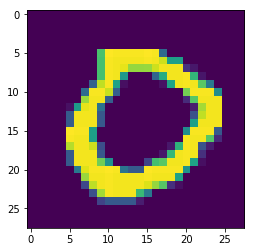

In [4]:
# Checking the datastructure.
# The first index defines the digit, the second defines it's position in the list.
len(numbers_test[0])
plt.imshow(numbers_train[0][5000])

In [5]:
# creating the final structure
num_list = []
X_test_batch = []
for i in range(80):
    for j in range(10):
        num_list.extend(numbers_test[j][i*10:(i+1)*10])
    X_test_batch.append(num_list)
    num_list = []

num_list = []
X_train_batch = []
for i in range(500):
    for j in range(10):
        num_list.extend(numbers_train[j][i*10:(i+1)*10])
    X_train_batch.append(num_list)
    num_list = []

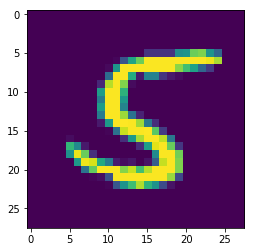

In [6]:
plt.imshow(X_test_batch[79][55])

## Training

In [7]:
# First, define the vision modules
digit_input = Input(shape=(28, 28, 1))
x = Conv2D(64, (3, 3))(digit_input)
x = Conv2D(64, (3, 3))(x)
x = MaxPooling2D((2, 2))(x)
x = Flatten()(x)
out = Dense(128, activation='relu')(x)
norm_layer = Lambda(lambda  x: keras.backend.l2_normalize(x,axis=1))(out)

vision_model = Model(digit_input, norm_layer)

# Then define the tell-digits-apart model
in_a = Input(shape=(28, 28, 1))
in_p = Input(shape=(28, 28, 1))
in_n = Input(shape=(28, 28, 1))

# The vision model will be shared, weights and all
out_a = vision_model(in_a)
out_p = vision_model(in_p)
out_n = vision_model(in_n)

concatenated = keras.layers.concatenate([out_a, out_p, out_n])

model = Model([in_a, in_p, in_n], concatenated)

In [8]:
vision_model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 28, 28, 1)         0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 26, 26, 64)        640       
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 24, 24, 64)        36928     
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 12, 12, 64)        0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 9216)              0         
_________________________________________________________________
dense_1 (Dense)              (None, 128)               1179776   
_________________________________________________________________
lambda_1 (Lambda)            (None, 128)               0         
Total para

In [9]:
model.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            (None, 28, 28, 1)    0                                            
__________________________________________________________________________________________________
input_3 (InputLayer)            (None, 28, 28, 1)    0                                            
__________________________________________________________________________________________________
input_4 (InputLayer)            (None, 28, 28, 1)    0                                            
__________________________________________________________________________________________________
model_1 (Model)                 (None, 128)          1217344     input_2[0][0]                    
                                                                 input_3[0][0]                    
          

The following function is a custom loss function based on the one used at https://thelonenutblog.wordpress.com/2018/02/13/how-to-potty-train-a-siamese-network/
It's been modified to match the one mentioned in the FaceNet paper.

In [10]:
import keras.backend as K
def triplet_loss(y_true, y_pred, alpha = 0.4):
    """
    Implementation of the triplet loss function
    Arguments:
    y_true -- true labels, required when you define a loss in Keras, you don't need it in this function.
    y_pred -- python list containing three objects:
            anchor -- the encodings for the anchor data
            positive -- the encodings for the positive data (similar to anchor)
            negative -- the encodings for the negative data (different from anchor)
    Returns:
    loss -- real number, value of the loss
    """

    anchor = y_pred[:,:128]
    positive = y_pred[:,128:256]
    negative = y_pred[:,256:]

    # distance between the anchor and the positive
    pos_dist = K.sum(K.square(anchor-positive),axis=1)

    # distance between the anchor and the negative
    neg_dist = K.sum(K.square(anchor-negative),axis=1)

    # compute loss
    basic_loss = pos_dist-neg_dist+alpha
    loss = K.maximum(basic_loss,0.0)
 
    return loss


Compiling the model with Adam optimiser and with triplet_loss function defined above.

In [11]:
from keras import optimizers

adam = optimizers.Adam(0.0001)

model.compile(optimizer=adam,
                  loss=triplet_loss)

The triplets are generated during training with the following generator. It generates only hard, and semi-hard triplets from the training batches. It can be also used to generate triplets for validation, when the for_training parameter is set to False.

In [12]:
import itertools

def tripletloss(anchor, positive, negative, alpha = 0.4):
    # distance between the anchor and the positive
    pos_dist = np.sum(np.square(anchor-positive))

    # distance between the anchor and the negative
    neg_dist = np.sum(np.square(anchor-negative))

    # compute loss
    basic_loss = pos_dist-neg_dist+alpha
    loss = np.maximum(basic_loss,0.0)
 
    return loss

def triplet_generator(network, X, for_training = True):
    preds = []
    imgs = []
    while True:
        for index in range(len(X)):
            preds = []
            imgs = []
            # A 10x10 db predikció elkészítése, és betöltése a predsbe
            for i in range(100):
                img = np.expand_dims(X[index][i], axis=0)
                img = np.expand_dims(img, axis=3)
                imgs.append(img)
                preds.append(network.predict([img,img,img])[0][0:128])
            # A duók elkészítése.
            duos = []
            img_duos = []
            for i in range(10):
                for duo in itertools.combinations(imgs[i*10:(i+1)*10],2):
                    img_duos.append(duo)
                for duo in itertools.combinations(preds[i*10:(i+1)*10],2):
                    duos.append(duo)
            # Tripletek készítése
            triplets = []
            img_triplets = []
            for i in range(10):
                dn = int(len(duos)/10)
                for j in range(dn):
                    ind = dn*i+j
                    iter = 0
                    found = False
                    while iter<100 and not found:
                        if for_training:
                            if iter not in range(i*10,(i+1)*10) and tripletloss(duos[ind][0],duos[ind][1],preds[iter]) > 0:
                                triplets.append([duos[ind][0],duos[ind][1],preds[iter]])
                                img_triplets.append([img_duos[ind][0],img_duos[ind][1],imgs[iter]])
                                found = True
                        else:
                            if iter not in range(i*10,(i+1)*10):
                                triplets.append([duos[ind][0],duos[ind][1],preds[iter]])
                                img_triplets.append([img_duos[ind][0],img_duos[ind][1],imgs[iter]])
                                found = True
                        iter += 1
            batch_size = len(img_triplets)
            batch1 = np.zeros((batch_size,28,28,1))
            batch2 = np.zeros((batch_size,28,28,1))
            batch3 = np.zeros((batch_size,28,28,1))
            for b in range(batch_size):
                batch1[b] = img_triplets[b][0][0,...]
                batch2[b] = img_triplets[b][1][0,...]
                batch3[b] = img_triplets[b][2][0,...]
            batch_x = [batch1,batch2,batch3]
            batch_y = np.zeros(batch_size)
            yield( batch_x, batch_y )

Displaying triplets from the first batch generated by the triplet_generator.

SHAPE OF THE BATCH: (449, 28, 28, 1)
1th Triplets of 449:
Positive distance: 0.18986794352531433
Negative distance: 0.5794878005981445
Prediction: 0.01:


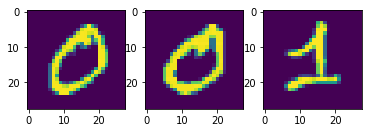

2th Triplets of 449:
Positive distance: 0.49088701605796814
Negative distance: 0.8790912628173828
Prediction: 0.01:


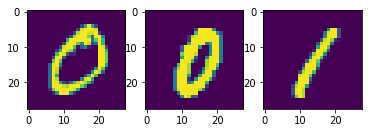

3th Triplets of 449:
Positive distance: 0.3326626420021057
Negative distance: 0.5794878005981445
Prediction: 0.15:


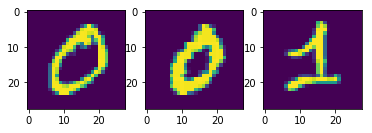

4th Triplets of 449:
Positive distance: 0.24739310145378113
Negative distance: 0.5794878005981445
Prediction: 0.07:


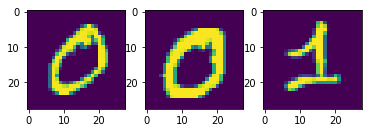

5th Triplets of 449:
Positive distance: 0.4191323518753052
Negative distance: 0.5794878005981445
Prediction: 0.24:


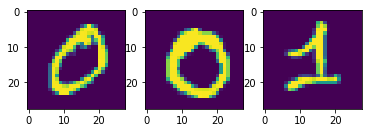

6th Triplets of 449:
Positive distance: 0.4277516007423401
Negative distance: 0.5794878005981445
Prediction: 0.25:


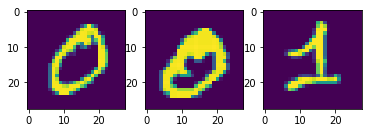

7th Triplets of 449:
Positive distance: 0.8268445730209351
Negative distance: 0.8790912628173828
Prediction: 0.35:


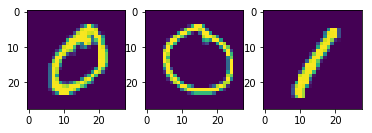

8th Triplets of 449:
Positive distance: 0.48548486828804016
Negative distance: 0.8790912628173828
Prediction: 0.01:


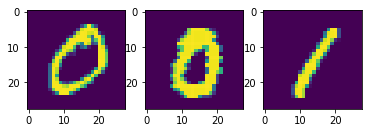

9th Triplets of 449:
Positive distance: 0.3407268226146698
Negative distance: 0.5794878005981445
Prediction: 0.16:


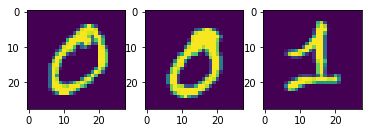

10th Triplets of 449:
Positive distance: 0.5578455924987793
Negative distance: 0.788030743598938
Prediction: 0.17:


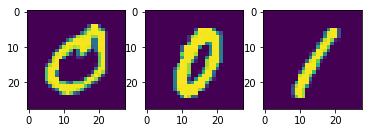

In [13]:
# creating an instance of the generator
i = 0
generator = triplet_generator(model,X_train_batch)
for batch in generator:
    print("SHAPE OF THE BATCH: {}".format(batch[0][2].shape))
    for tri in range(10):
        anch = np.expand_dims(batch[0][0][tri,...], axis=0)
        pos = np.expand_dims(batch[0][1][tri,...], axis=0)
        neg = np.expand_dims(batch[0][2][tri,...], axis=0)
        print("{}th Triplets of {}:".format(tri+1,len(batch[1])))
        # creating predictions
        preds = model.predict([anch,pos,neg])[0]
        anch_pred = preds[:128]
        pos_pred = preds[128:256]
        neg_pred = preds[256:]
        print("Positive distance: {}".format(np.sum(np.square(anch_pred-pos_pred))))
        print("Negative distance: {}".format(np.sum(np.square(anch_pred-neg_pred))))
        loss = tripletloss(anch_pred,pos_pred,neg_pred)
        print("Prediction: %.2f:"%(loss))
        f, axarr = plt.subplots(1,3)
        axarr[0].imshow(anch[0][:,:,0])
        axarr[1].imshow(pos[0][:,:,0])
        axarr[2].imshow(neg[0][:,:,0])
        plt.show()
    i = i+1
    if i > 0:
        break

Training the model with the generators. We train only a few epochs, because this is only for testing the training method.

In [14]:
train_generator = triplet_generator(model,X_train_batch)
history = model.fit_generator(
      train_generator,
      steps_per_epoch=len(X_train_batch),
      epochs=3,
      verbose=1)

Epoch 1/3
500/500 [==============================] - 437s 874ms/step - loss: 0.2115
Epoch 2/3
500/500 [==============================] - 410s 821ms/step - loss: 0.2140
Epoch 3/3
500/500 [==============================] - 394s 789ms/step - loss: nan


Displaying triplets of the first batch generated by the triplet_generator. This time it is visible, that the triplets are more similar looking, meaning the network works as we expected. It generates harder and harder triplets as it learns to recognize the features. It reached a nan loss in the third epoch, because it got a batch, where there weren't any hard triplets anymore. The triplets seen here, are from the test dataset.

SHAPE OF THE BATCH: (71, 28, 28, 1)
1th Triplets of 71:
Positive distance: 0.9867079257965088
Negative distance: 1.3665180206298828
Prediction: 0.02:


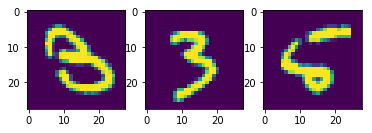

2th Triplets of 71:
Positive distance: 1.1279029846191406
Negative distance: 1.3665180206298828
Prediction: 0.16:


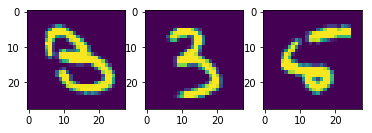

3th Triplets of 71:
Positive distance: 1.0662627220153809
Negative distance: 1.3665180206298828
Prediction: 0.10:


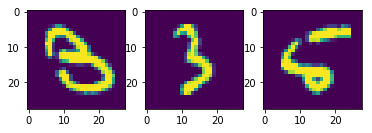

4th Triplets of 71:
Positive distance: 0.8791114687919617
Negative distance: 0.9308767914772034
Prediction: 0.35:


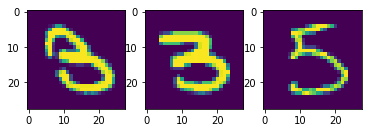

5th Triplets of 71:
Positive distance: 1.4664814472198486
Negative distance: 1.8350393772125244
Prediction: 0.03:


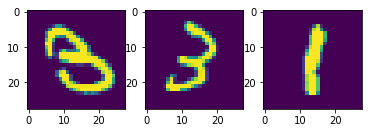

6th Triplets of 71:
Positive distance: 1.0551069974899292
Negative distance: 1.3665180206298828
Prediction: 0.09:


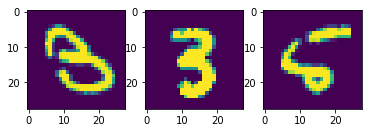

7th Triplets of 71:
Positive distance: 0.7706214785575867
Negative distance: 0.9308767914772034
Prediction: 0.24:


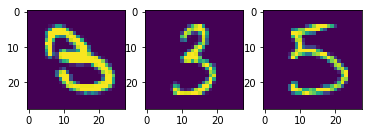

8th Triplets of 71:
Positive distance: 1.1415982246398926
Negative distance: 1.3665180206298828
Prediction: 0.18:


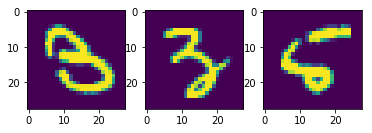

9th Triplets of 71:
Positive distance: 0.8438238501548767
Negative distance: 0.9308767914772034
Prediction: 0.31:


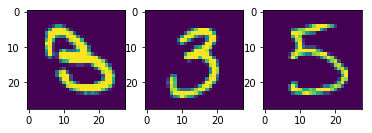

10th Triplets of 71:
Positive distance: 0.5386455655097961
Negative distance: 0.9212844967842102
Prediction: 0.02:


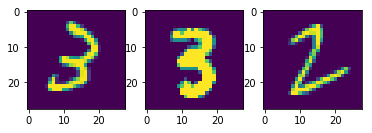

In [15]:
# creating an instance of the generator
i = 0
generator = triplet_generator(model,X_test_batch)
for batch in generator:
    print("SHAPE OF THE BATCH: {}".format(batch[0][2].shape))
    for tri in range(10):
        anch = np.expand_dims(batch[0][0][tri,...], axis=0)
        pos = np.expand_dims(batch[0][1][tri,...], axis=0)
        neg = np.expand_dims(batch[0][2][tri,...], axis=0)
        print("{}th Triplets of {}:".format(tri+1,len(batch[1])))
        # creating predictions
        preds = model.predict([anch,pos,neg])[0]
        anch_pred = preds[:128]
        pos_pred = preds[128:256]
        neg_pred = preds[256:]
        print("Positive distance: {}".format(np.sum(np.square(anch_pred-pos_pred))))
        print("Negative distance: {}".format(np.sum(np.square(anch_pred-neg_pred))))
        loss = tripletloss(anch_pred,pos_pred,neg_pred)
        print("Prediction: %.2f:"%(loss))
        f, axarr = plt.subplots(1,3)
        axarr[0].imshow(anch[0][:,:,0])
        axarr[1].imshow(pos[0][:,:,0])
        axarr[2].imshow(neg[0][:,:,0])
        plt.show()
    i = i+1
    if i > 0:
        break

## Visualization testing

The following cells are based on the umap documentation example: https://umap-learn.readthedocs.io/en/latest/basic_usage.html#

In [16]:
from sklearn.datasets import load_iris, load_digits
from sklearn.model_selection import train_test_split
import seaborn as sns
import pandas as pd
import umap
sns.set(style='white', context='notebook', rc={'figure.figsize':(14,10)})

In [17]:
x_test = X_test.reshape(10000, -1)
x_test.shape

(10000, 784)

In [18]:
reducer = umap.UMAP(random_state=42)
reducer.fit(x_test)

UMAP(a=None, angular_rp_forest=False, b=None, init='spectral',
   learning_rate=1.0, local_connectivity=1.0, metric='euclidean',
   metric_kwds=None, min_dist=0.1, n_components=2, n_epochs=None,
   n_neighbors=15, negative_sample_rate=5, random_state=42,
   repulsion_strength=1.0, set_op_mix_ratio=1.0, spread=1.0,
   target_metric='categorical', target_metric_kwds=None,
   target_n_neighbors=-1, target_weight=0.5, transform_queue_size=4.0,
   transform_seed=42, verbose=False)

In [19]:
embedding = reducer.transform(x_test)
# Verify that the result of calling transform is
# idenitical to accessing the embedding_ attribute
assert(np.all(embedding == reducer.embedding_))
embedding.shape

(10000, 2)

Text(0.5,1,'UMAP projection of the Digits dataset')

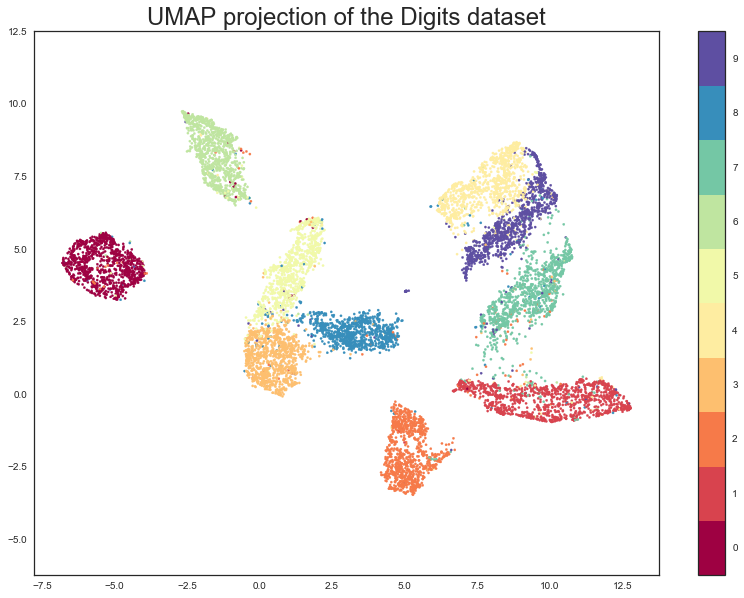

In [20]:
plt.scatter(embedding[:, 0], embedding[:, 1], c=Y_test, cmap='Spectral', s=5)
plt.gca().set_aspect('equal', 'datalim')
plt.colorbar(boundaries=np.arange(11)-0.5).set_ticks(np.arange(10))
plt.title('UMAP projection of the Digits dataset', fontsize=24)

In [21]:
from io import BytesIO
from PIL import Image
import base64

In [22]:
def embeddable_image(data):
    img_data = 255 - 15 * data.astype(np.uint8)
    image = Image.fromarray(img_data, mode='L').resize((64, 64), Image.BICUBIC)
    buffer = BytesIO()
    image.save(buffer, format='png')
    for_encoding = buffer.getvalue()
    return 'data:image/png;base64,' + base64.b64encode(for_encoding).decode()

In [23]:
from bokeh.plotting import figure, show, output_notebook
from bokeh.models import HoverTool, ColumnDataSource, CategoricalColorMapper
from bokeh.palettes import Spectral10

In [24]:
output_notebook()
digits_df = pd.DataFrame(embedding, columns=('x', 'y'))
digits_df['digit'] = [str(x) for x in Y_test]
digits_df['image'] = list(map(embeddable_image, X_test*255))

datasource = ColumnDataSource(digits_df)
color_mapping = CategoricalColorMapper(factors=[str(9 - x) for x in [1,2,3,4,5,6,7,8,9]],
                                       palette=Spectral10)

plot_figure = figure(
    title='UMAP projection of the Digits dataset',
    plot_width=600,
    plot_height=600,
    tools=('pan, wheel_zoom, reset')
)

plot_figure.add_tools(HoverTool(tooltips="""
<div>
    <div>
        <img src='@image' style='float: left; margin: 5px 5px 5px 5px'/>
    </div>
    <div>
        <span style='font-size: 16px; color: #224499'>Digit:</span>
        <span style='font-size: 18px'>@digit</span>
    </div>
</div>
"""))

plot_figure.circle(
    'x',
    'y',
    source=datasource,
    color=dict(field='digit', transform=color_mapping),
    line_alpha=0.6,
    fill_alpha=0.6,
    size=4
)
show(plot_figure)

Loading BokehJS ...